# H1 / H2 transfer function & coherence — **LA2A** (SignalTrain)

LA2A counterpart of `eval_output_transformer_h1_coherence.ipynb`. Same analyses,
adapted to the SignalTrain LA-2A dataset:

* dry/wet pairs live in `LA2A/all/` as `input_<id>_.wav` /
  `target_<id>_LA2A_<cfg>__<comp>__<pr>.wav`;
* a **setting** is the `(Comp/Limit, Peak-Reduction)` knob pair, written
  `cl<comp>_pr<pr>` (comp 0 = *Compress*, 1 = *Limit*; pr ∈ {0,5,…,100});
* the gain-matched front-end is computed **on the fly** with
  `gain_reduction_db(dry, wet, 1024)` — the exact RMS window used to export the
  shipped `gr_curves/*.pt`, so no need to load the 20-min GR tensors.

For each setting we Welch-average short-time spectra (via **librosa**) to estimate:

* **H1** `= Sxy / Sxx`,  **H2** `= Syy / conj(Sxy)`,
* **coherence** `Cxy = |Sxy|² / (Sxx·Syy) = H1 / H2`,

for both the **raw** dry→wet and the **gain-matched**→wet variants, plus a
**time-varying 3D** FRF/coherence view for the hardest setting (`cl1_pr100`).

Because there are 42 settings, the per-setting plots are coloured by
**peak-reduction** (colourbar) with **line style** for the mode
(solid = Compress, dashed = Limit), instead of a 42-entry legend.

In [1]:
import os
import sys
import re
import glob
import gc
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import librosa
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

warnings.filterwarnings("ignore", category=UserWarning)

REPO_ROOT = next(
    (p for p in [Path.cwd().resolve(), *Path.cwd().resolve().parents] if (p / "pyproject.toml").is_file()),
    Path.cwd().resolve(),
)
sys.path.insert(0, str(REPO_ROOT / "06_output"))
sys.path.insert(0, str(REPO_ROOT / "03_initial_GR_pred"))

from amplitude_match import GR_DB_MIN, GR_DB_MAX, gr_db_to_gain
from eval_helpers import _read_dry_wet_segment, _pair_num_frames
from src.dsp_torch import gain_reduction_db, RMS_WINDOW

print(f"repo    : {REPO_ROOT}")
print(f"torch   : {torch.__version__}")
print(f"librosa : {librosa.__version__}")
print(f"RMS win : {RMS_WINDOW}")


repo    : /Volumes/Saola's Drive/AllCode/thesis/Virtual-Analogue-Compressor-Modelling
torch   : 2.10.0
librosa : 0.11.0
RMS win : 1024


In [2]:
# SignalTrain LA-2A
DATA_ROOT = "/Volumes/Saola\'s Drive/AllCode/thesis/data/LA2A"
SAMPLE_RATE = 44100

# 20-min files: cap analysed duration per pair (plenty of frames for averaging).
ANALYZE_SEC_PER_PAIR = 120.0
STREAM_CHUNK_SEC = 20.0

# --- STFT / spectral-averaging parameters (librosa) ---
N_FFT = 4096
HOP_LENGTH = N_FFT // 4
WINDOW = "hann"
EPS = 1e-12

# Set to a small integer for smoke tests (limits pairs analysed)
MAX_EVAL_PAIRS = None

ALL_DIR = os.path.join(DATA_ROOT, "all")
assert os.path.isdir(ALL_DIR), f"Missing {ALL_DIR}"

_TARGET_RE = re.compile(r"target_(\d+)_LA2A_\dc__(\d+)__(\d+)\.wav$")


def discover_la2a_pairs(all_dir: str) -> list[dict]:
    """Pair input_<id>_.wav with target_<id>_..__<comp>__<pr>.wav."""
    pairs = []
    for tgt in sorted(glob.glob(os.path.join(all_dir, "target_*.wav"))):
        m = _TARGET_RE.search(os.path.basename(tgt))
        if not m:
            continue
        pid, comp, pr = m.group(1), int(m.group(2)), int(m.group(3))
        dry = os.path.join(all_dir, f"input_{pid}_.wav")
        if not os.path.isfile(dry):
            continue
        pairs.append(
            {"id": pid, "comp": comp, "pr": pr, "setting": f"cl{comp}_pr{pr}",
             "dry": dry, "wet": tgt}
        )
    return sorted(pairs, key=lambda p: (p["comp"], p["pr"], p["id"]))


PAIRS = discover_la2a_pairs(ALL_DIR)
if MAX_EVAL_PAIRS is not None:
    PAIRS = PAIRS[:MAX_EVAL_PAIRS]

# setting -> sorted list of pair dicts
SETTING_PAIRS: dict[str, list[dict]] = {}
for p in PAIRS:
    SETTING_PAIRS.setdefault(p["setting"], []).append(p)
SETTINGS = sorted(SETTING_PAIRS, key=lambda s: (int(s.split("_pr")[0][2:]), int(s.split("_pr")[1])))


def setting_comp_pr(setting: str) -> tuple[int, int]:
    comp = int(setting.split("_pr")[0][2:])
    pr = int(setting.split("_pr")[1])
    return comp, pr


print(f"Pairs discovered : {len(PAIRS)}")
print(f"Settings         : {len(SETTINGS)}  "
      f"(Compress={sum(setting_comp_pr(s)[0]==0 for s in SETTINGS)}, "
      f"Limit={sum(setting_comp_pr(s)[0]==1 for s in SETTINGS)})")

chunk_frames = int(round(STREAM_CHUNK_SEC * SAMPLE_RATE))
analyze_frames = int(round(ANALYZE_SEC_PER_PAIR * SAMPLE_RATE))
FREQS = librosa.fft_frequencies(sr=SAMPLE_RATE, n_fft=N_FFT)
print(f"Analyse {ANALYZE_SEC_PER_PAIR:.0f}s/pair | n_fft={N_FFT}, hop={HOP_LENGTH} "
      f"-> {len(FREQS)} freq bins")


Pairs discovered : 84
Settings         : 42  (Compress=21, Limit=21)


Analyse 120s/pair | n_fft=4096, hop=1024 -> 2049 freq bins


/Volumes/Saola's Drive/AllCode/thesis/Virtual-Analogue-Compressor-Modelling/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Spectral accumulators

Identical to the Diff-SSL notebook: per setting we keep running Welch sums over
all frames of all pairs using that setting, for the *raw* and *gain-matched*
inputs:

* `Sxx = Σ |X|²`, `Syy = Σ |Y|²`, `Sxy = Σ X* · Y`  →  `H1`, `H2`, `Cxy`.

The gain-matched input is `dry · 10**(gr_db/20)` with
`gr_db = gain_reduction_db(dry, wet, 1024)` clamped to `[GR_DB_MIN, GR_DB_MAX]`.

In [3]:
def _stft(sig: np.ndarray) -> np.ndarray:
    return librosa.stft(
        np.ascontiguousarray(sig, dtype=np.float32),
        n_fft=N_FFT, hop_length=HOP_LENGTH, window=WINDOW, center=False,
    )


class SpectralAccumulator:
    """Welch-averaged auto/cross spectra for one (input, target) variant."""

    def __init__(self, n_bins: int):
        self.Sxx = np.zeros(n_bins, dtype=np.float64)
        self.Syy = np.zeros(n_bins, dtype=np.float64)
        self.Sxy = np.zeros(n_bins, dtype=np.complex128)
        self.n_frames = 0

    def add(self, x: np.ndarray, y: np.ndarray) -> None:
        if len(x) < N_FFT or len(y) < N_FFT:
            return
        X, Y = _stft(x), _stft(y)
        self.Sxx += np.sum(np.abs(X) ** 2, axis=1)
        self.Syy += np.sum(np.abs(Y) ** 2, axis=1)
        self.Sxy += np.sum(np.conj(X) * Y, axis=1)
        self.n_frames += X.shape[1]

    def h1(self):
        return self.Sxy / (self.Sxx + EPS)

    def h2(self):
        return self.Syy / (np.conj(self.Sxy) + EPS)

    def coherence(self):
        return (np.abs(self.Sxy) ** 2) / (self.Sxx * self.Syy + EPS)


@torch.no_grad()
def accumulate_pair(pair: dict, acc_raw, acc_matched, max_frames: int) -> None:
    """Stream one (dry, wet) pair, adding to raw + gain-matched accumulators."""
    total = min(_pair_num_frames(pair["dry"], pair["wet"], SAMPLE_RATE), max_frames)
    for o in range(0, total, chunk_frames):
        stop = min(o + chunk_frames, total)
        dry, wet = _read_dry_wet_segment(pair["dry"], pair["wet"], o, stop, SAMPLE_RATE)
        L = min(dry.shape[-1], wet.shape[-1])
        if L < N_FFT:
            continue
        dry, wet = dry[..., :L], wet[..., :L]
        gr_db = gain_reduction_db(dry, wet, RMS_WINDOW).clamp(GR_DB_MIN, GR_DB_MAX)
        matched = dry * gr_db_to_gain(gr_db, clamp=False)
        acc_raw.add(dry.squeeze(0).numpy(), wet.squeeze(0).numpy())
        acc_matched.add(matched.squeeze(0).numpy(), wet.squeeze(0).numpy())


In [4]:
# ── Run accumulation, per setting ──────────────────────────────────────────
results = {}  # setting -> {"raw": acc, "matched": acc, "pairs": [...]}

for si, setting in enumerate(SETTINGS, start=1):
    acc_raw = SpectralAccumulator(len(FREQS))
    acc_matched = SpectralAccumulator(len(FREQS))
    spairs = SETTING_PAIRS[setting]
    for p in spairs:
        print(f"[{si}/{len(SETTINGS)}] {setting} | id {p['id']}")
        accumulate_pair(p, acc_raw, acc_matched, analyze_frames)
        gc.collect()
    results[setting] = {"raw": acc_raw, "matched": acc_matched, "pairs": spairs}

print("\nFrames accumulated per setting:")
for setting in SETTINGS:
    print(f"  {setting:12s} {results[setting]['raw'].n_frames:>7d} frames "
          f"({len(results[setting]['pairs'])} pair(s))")


[1/42] cl0_pr0 | id 138


[1/42] cl0_pr0 | id 222


[2/42] cl0_pr5 | id 139


[2/42] cl0_pr5 | id 223


[3/42] cl0_pr10 | id 140


[3/42] cl0_pr10 | id 224


[4/42] cl0_pr15 | id 141


[4/42] cl0_pr15 | id 225


[5/42] cl0_pr20 | id 142


[5/42] cl0_pr20 | id 226


[6/42] cl0_pr25 | id 143


[6/42] cl0_pr25 | id 227


[7/42] cl0_pr30 | id 144


[7/42] cl0_pr30 | id 228


[8/42] cl0_pr35 | id 145


[8/42] cl0_pr35 | id 229


[9/42] cl0_pr40 | id 146


[9/42] cl0_pr40 | id 230


[10/42] cl0_pr45 | id 147


[10/42] cl0_pr45 | id 231


[11/42] cl0_pr50 | id 148


[11/42] cl0_pr50 | id 232


[12/42] cl0_pr55 | id 149


[12/42] cl0_pr55 | id 233


[13/42] cl0_pr60 | id 150


[13/42] cl0_pr60 | id 234


[14/42] cl0_pr65 | id 151


[14/42] cl0_pr65 | id 235


[15/42] cl0_pr70 | id 152


[16/42] cl0_pr75 | id 153


[16/42] cl0_pr75 | id 237


[17/42] cl0_pr80 | id 154


[17/42] cl0_pr80 | id 238


[18/42] cl0_pr85 | id 155


[18/42] cl0_pr85 | id 239


[19/42] cl0_pr90 | id 156


[19/42] cl0_pr90 | id 240


[20/42] cl0_pr95 | id 157


[20/42] cl0_pr95 | id 241


[21/42] cl0_pr100 | id 158


[21/42] cl0_pr100 | id 242


[22/42] cl1_pr0 | id 159


[22/42] cl1_pr0 | id 243


[23/42] cl1_pr5 | id 160


[23/42] cl1_pr5 | id 244


[24/42] cl1_pr10 | id 161


[24/42] cl1_pr10 | id 245


[25/42] cl1_pr15 | id 162


[25/42] cl1_pr15 | id 246


[26/42] cl1_pr20 | id 163


[26/42] cl1_pr20 | id 247


[27/42] cl1_pr25 | id 164


[27/42] cl1_pr25 | id 248


[28/42] cl1_pr30 | id 165


[28/42] cl1_pr30 | id 249


[29/42] cl1_pr35 | id 166


[29/42] cl1_pr35 | id 250


[30/42] cl1_pr40 | id 167


[30/42] cl1_pr40 | id 251


[31/42] cl1_pr45 | id 168


[31/42] cl1_pr45 | id 252


[32/42] cl1_pr50 | id 169


[32/42] cl1_pr50 | id 253


[33/42] cl1_pr55 | id 170


[33/42] cl1_pr55 | id 254


[34/42] cl1_pr60 | id 171


[34/42] cl1_pr60 | id 255


[35/42] cl1_pr65 | id 172


[35/42] cl1_pr65 | id 256


[36/42] cl1_pr70 | id 173


[36/42] cl1_pr70 | id 257


[37/42] cl1_pr75 | id 174


[37/42] cl1_pr75 | id 258


[38/42] cl1_pr80 | id 175


[38/42] cl1_pr80 | id 259


[39/42] cl1_pr85 | id 176


[39/42] cl1_pr85 | id 260


[40/42] cl1_pr90 | id 177


[40/42] cl1_pr90 | id 261


[41/42] cl1_pr95 | id 178


[41/42] cl1_pr95 | id 262


[42/42] cl1_pr100 | id 179


[42/42] cl1_pr100 | id 221


[42/42] cl1_pr100 | id 263



Frames accumulated per setting:
  cl0_pr0        10296 frames (2 pair(s))
  cl0_pr5        10296 frames (2 pair(s))
  cl0_pr10       10296 frames (2 pair(s))
  cl0_pr15       10296 frames (2 pair(s))
  cl0_pr20       10296 frames (2 pair(s))
  cl0_pr25       10296 frames (2 pair(s))
  cl0_pr30       10296 frames (2 pair(s))
  cl0_pr35       10296 frames (2 pair(s))
  cl0_pr40       10296 frames (2 pair(s))
  cl0_pr45       10296 frames (2 pair(s))
  cl0_pr50       10296 frames (2 pair(s))
  cl0_pr55       10296 frames (2 pair(s))
  cl0_pr60       10296 frames (2 pair(s))
  cl0_pr65       10296 frames (2 pair(s))
  cl0_pr70        5148 frames (1 pair(s))
  cl0_pr75       10296 frames (2 pair(s))
  cl0_pr80       10296 frames (2 pair(s))
  cl0_pr85       10296 frames (2 pair(s))
  cl0_pr90       10296 frames (2 pair(s))
  cl0_pr95       10296 frames (2 pair(s))
  cl0_pr100      10296 frames (2 pair(s))
  cl1_pr0        10296 frames (2 pair(s))
  cl1_pr5        10296 frames (2 pair(s))
 

## Plot — raw input vs target

`H1` (top) and `H2` (middle) magnitude on shared y-range, plus coherence
(bottom), per setting. **Colour = peak-reduction** (0→100), **line style** =
mode (solid Compress, dashed Limit). The magnitude is dominated by the broadband
gain reduction, which deepens with peak-reduction.

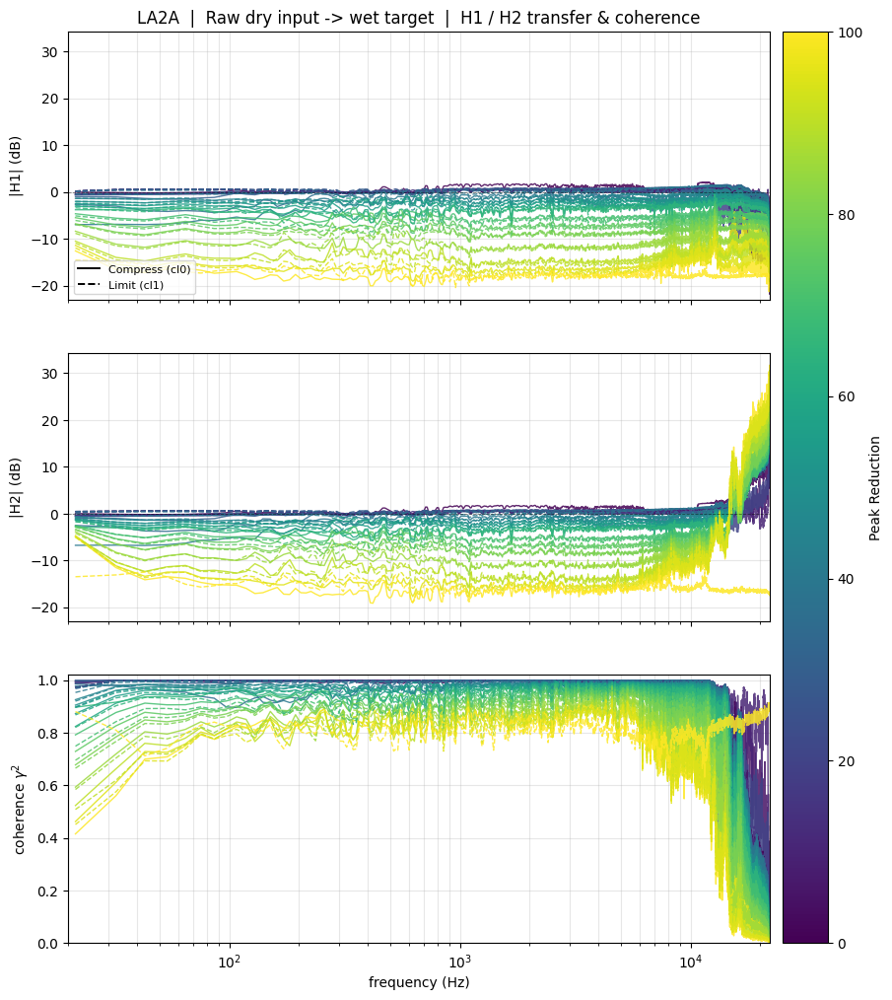

In [5]:
F_MIN, F_MAX = 20.0, SAMPLE_RATE / 2
fmask = (FREQS >= F_MIN) & (FREQS <= F_MAX)
PR_NORM = Normalize(vmin=0, vmax=100)
PR_CMAP = plt.get_cmap("viridis")
_MODE_HANDLES = [
    Line2D([0], [0], color="k", lw=1.4, ls="-", label="Compress (cl0)"),
    Line2D([0], [0], color="k", lw=1.4, ls="--", label="Limit (cl1)"),
]


def plot_variant(variant: str, title: str):
    fig, (ax_h1, ax_h2, ax_coh) = plt.subplots(3, 1, figsize=(11, 12), sharex=True)
    for setting in SETTINGS:
        comp, pr = setting_comp_pr(setting)
        acc = results[setting][variant]
        mag1 = 20 * np.log10(np.abs(acc.h1()) + EPS)
        mag2 = 20 * np.log10(np.abs(acc.h2()) + EPS)
        coh = acc.coherence()
        color = PR_CMAP(PR_NORM(pr))
        ls = "-" if comp == 0 else "--"
        ax_h1.semilogx(FREQS[fmask], mag1[fmask], color=color, ls=ls, lw=1.0, alpha=0.85)
        ax_h2.semilogx(FREQS[fmask], mag2[fmask], color=color, ls=ls, lw=1.0, alpha=0.85)
        ax_coh.semilogx(FREQS[fmask], coh[fmask], color=color, ls=ls, lw=1.0, alpha=0.85)

    for ax in (ax_h1, ax_h2):
        ax.grid(True, which="both", alpha=0.3)
        ax.axhline(0, color="k", lw=0.6, ls="--", alpha=0.5)
    ylo = min(ax_h1.get_ylim()[0], ax_h2.get_ylim()[0])
    yhi = max(ax_h1.get_ylim()[1], ax_h2.get_ylim()[1])
    ax_h1.set_ylim(ylo, yhi)
    ax_h2.set_ylim(ylo, yhi)

    ax_h1.set_ylabel("|H1| (dB)")
    ax_h1.set_title(title)
    ax_h1.legend(handles=_MODE_HANDLES, fontsize=8, loc="lower left")
    ax_h2.set_ylabel("|H2| (dB)")

    ax_coh.set_ylabel("coherence $\\gamma^2$")
    ax_coh.set_xlabel("frequency (Hz)")
    ax_coh.set_ylim(0, 1.02)
    ax_coh.grid(True, which="both", alpha=0.3)
    ax_coh.set_xlim(F_MIN, F_MAX)

    sm = ScalarMappable(norm=PR_NORM, cmap=PR_CMAP)
    sm.set_array([])
    fig.colorbar(sm, ax=[ax_h1, ax_h2, ax_coh], label="Peak Reduction", pad=0.015)
    plt.show()


plot_variant("raw", "LA2A  |  Raw dry input -> wet target  |  H1 / H2 transfer & coherence")


## Plot — gain-matched input vs target

Dry input amplitude-matched with its GR envelope before the estimate. With the
broadband level removed, `|H1|`/`|H2|` hover near 0 dB and any deviation (plus
the H1↔H2 gap) reflects the LA-2A's residual frequency-dependent **coloration**
and nonlinearity.

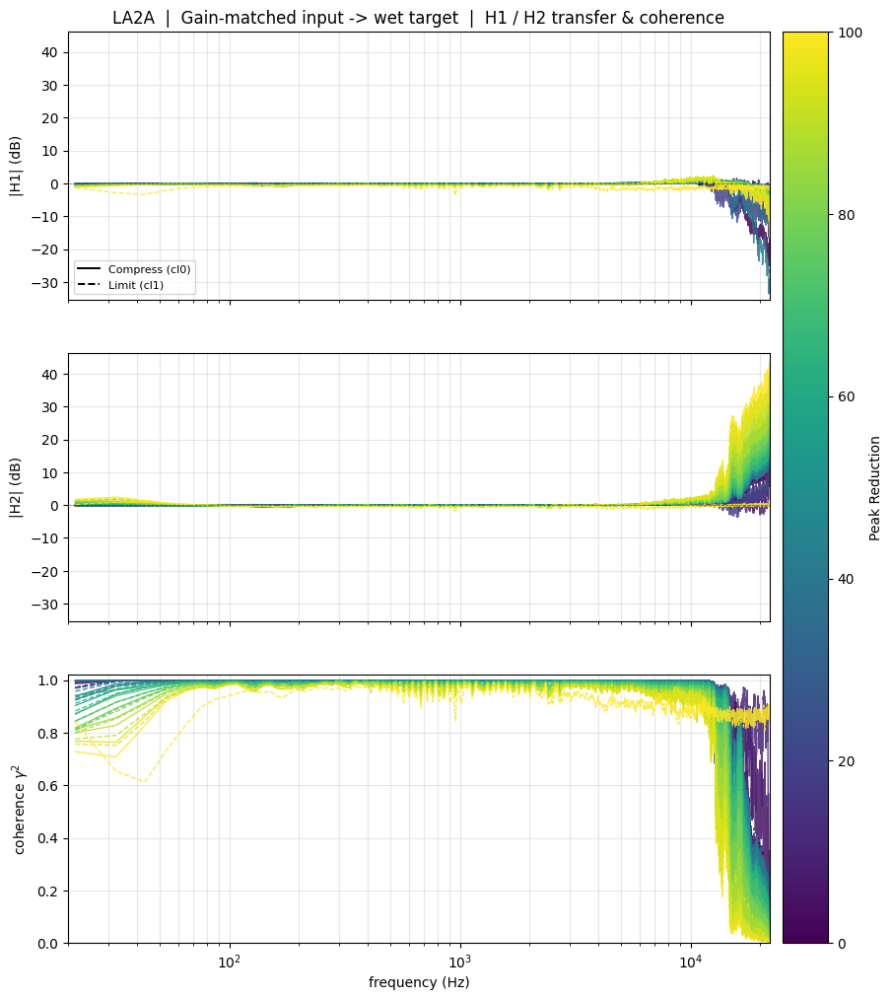

In [6]:
plot_variant("matched", "LA2A  |  Gain-matched input -> wet target  |  H1 / H2 transfer & coherence")

## Summary table

Frame counts and broadband (200 Hz–8 kHz) average coherence / |H1| / |H2| per
setting, for both variants.

In [7]:
band = (FREQS >= 200) & (FREQS <= 8000)
rows = []
for setting in SETTINGS:
    comp, pr = setting_comp_pr(setting)
    r = {"Setting": setting, "Mode": "Compress" if comp == 0 else "Limit",
         "PeakRed": pr, "Pairs": len(results[setting]["pairs"]),
         "Frames": results[setting]["raw"].n_frames}
    for variant in ("raw", "matched"):
        acc = results[setting][variant]
        r[f"{variant} coh"] = float(np.mean(acc.coherence()[band]))
        r[f"{variant} |H1| dB"] = float(np.mean(20 * np.log10(np.abs(acc.h1()[band]) + EPS)))
        r[f"{variant} |H2| dB"] = float(np.mean(20 * np.log10(np.abs(acc.h2()[band]) + EPS)))
    rows.append(r)

summary_df = pd.DataFrame(rows)
display(summary_df)


,Setting,Mode,PeakRed,Pairs,Frames,raw coh,raw |H1| dB,raw |H2| dB,matched coh,matched |H1| dB,matched |H2| dB
0,cl0_pr0,Compress,0,2,10296,0.993025,0.983388,1.044236,0.999789,0.073704,0.075533
1,cl0_pr5,Compress,5,2,10296,0.997507,0.272228,0.293915,0.998840,0.113053,0.123138
2,cl0_pr10,Compress,10,2,10296,0.998485,0.121793,0.134965,0.999443,0.080428,0.085265
3,cl0_pr15,Compress,15,2,10296,0.998275,0.545745,0.560745,0.999957,0.083812,0.084185
4,cl0_pr20,Compress,20,2,10296,0.998007,0.107600,0.124935,0.999787,0.073565,0.075416
5,cl0_pr25,Compress,25,2,10296,0.997416,0.412867,0.435348,0.999923,0.090248,0.090914
6,cl0_pr30,Compress,30,2,10296,0.996326,0.452511,0.484491,0.999946,0.107849,0.108314
7,cl0_pr35,Compress,35,2,10296,0.976714,-0.756772,-0.551417,0.999493,0.067908,0.072316
8,cl0_pr40,Compress,40,2,10296,0.961780,-2.274967,-1.935621,0.997987,-0.000689,0.016823
9,cl0_pr45,Compress,45,2,10296,0.986535,-0.951355,-0.833297,0.998849,0.057151,0.067159


## Time-varying FRF & coherence (3D) — hardest setting

Hardest LA-2A setting = **Limit mode, max peak-reduction** (`cl1_pr100`). A short
STFT window is slid across one pair; a sliding **block** of several overlapping
windows is Welch-averaged into each `H1(f)` / `coherence(f)` column (a single
window gives `γ²≡1` trivially). Plotted as time × frequency × amplitude (colour),
as heatmaps then a 3D surface. The chosen DSP settings are printed below.

In [8]:
SETTING_3D = "cl1_pr100"
assert SETTING_3D in SETTINGS, f"{SETTING_3D} not found"
PAIR_3D = SETTING_PAIRS[SETTING_3D][0]          # first pair for this setting
ANALYSIS_START_SEC = 0.0
ANALYSIS_DUR_SEC = 60.0

# ── Chosen signal-processing settings ──────────────────────────────────────
TV_WIN = 1024            # STFT window (Hann): 23.2 ms @ 44.1 kHz -> ~43 Hz res
TV_OVERLAP = 0.75        # window overlap -> hop = 256 samples (5.8 ms)
TV_BLOCK_SEC = 0.5       # averaging block per time column (Welch averaging)
TV_BLOCK_HOP_SEC = 0.1   # block hop -> time-axis step (80% block overlap)
TV_FMAX = 16000.0


def time_varying_frf(x, y, sr, win, overlap, block_sec, block_hop_sec):
    hop = int(round(win * (1 - overlap)))
    freqs = librosa.fft_frequencies(sr=sr, n_fft=win)
    X = librosa.stft(np.ascontiguousarray(x, np.float32), n_fft=win,
                     hop_length=hop, window="hann", center=False)
    Y = librosa.stft(np.ascontiguousarray(y, np.float32), n_fft=win,
                     hop_length=hop, window="hann", center=False)
    Sxx, Syy, Sxy = np.abs(X) ** 2, np.abs(Y) ** 2, np.conj(X) * Y
    n_fr = X.shape[1]
    fpb = max(1, int(round(block_sec * sr / hop)))
    bstep = max(1, int(round(block_hop_sec * sr / hop)))
    frame_t = (np.arange(n_fr) * hop + win / 2) / sr
    times, H, C = [], [], []
    for s in range(0, n_fr - fpb + 1, bstep):
        sl = slice(s, s + fpb)
        axx, ayy, axy = Sxx[:, sl].sum(1), Syy[:, sl].sum(1), Sxy[:, sl].sum(1)
        H.append(axy / (axx + EPS))
        C.append((np.abs(axy) ** 2) / (axx * ayy + EPS))
        times.append(frame_t[sl].mean())
    return freqs, np.asarray(times), np.asarray(H).T, np.asarray(C).T, fpb, hop


_start = int(ANALYSIS_START_SEC * SAMPLE_RATE)
_total = _pair_num_frames(PAIR_3D["dry"], PAIR_3D["wet"], SAMPLE_RATE)
_stop = _total if ANALYSIS_DUR_SEC is None else min(_total, _start + int(ANALYSIS_DUR_SEC * SAMPLE_RATE))
_dry, _wet = _read_dry_wet_segment(PAIR_3D["dry"], PAIR_3D["wet"], _start, _stop, SAMPLE_RATE)

TV_FREQS, TV_TIMES, TV_H1, TV_COH, TV_FPB, TV_HOP = time_varying_frf(
    _dry.squeeze(0).numpy(), _wet.squeeze(0).numpy(), SAMPLE_RATE,
    TV_WIN, TV_OVERLAP, TV_BLOCK_SEC, TV_BLOCK_HOP_SEC,
)

print(f"Setting (hardest)     : {SETTING_3D}  (Limit, Peak Reduction 100)")
print(f"Pair / excerpt        : id {PAIR_3D['id']}  [{ANALYSIS_START_SEC:.0f}-"
      f"{_stop / SAMPLE_RATE:.0f}s]")
print("\n── Final signal-processing settings ──")
print(f"  STFT window          : {TV_WIN} samples ({TV_WIN / SAMPLE_RATE * 1e3:.1f} ms, Hann)")
print(f"  Frequency resolution : {SAMPLE_RATE / TV_WIN:.1f} Hz/bin")
print(f"  Window overlap       : {TV_OVERLAP * 100:.0f}%  (hop {TV_HOP} samples, "
      f"{TV_HOP / SAMPLE_RATE * 1e3:.1f} ms)")
print(f"  Averaging block      : {TV_BLOCK_SEC * 1e3:.0f} ms = {TV_FPB} overlapping "
      f"windows averaged / time column")
print(f"  Block hop            : {TV_BLOCK_HOP_SEC * 1e3:.0f} ms "
      f"({(1 - TV_BLOCK_HOP_SEC / TV_BLOCK_SEC) * 100:.0f}% block overlap)")
print(f"  Output grid          : {TV_H1.shape[0]} freq bins x {TV_H1.shape[1]} time columns")


Setting (hardest)     : cl1_pr100  (Limit, Peak Reduction 100)
Pair / excerpt        : id 179  [0-60s]

── Final signal-processing settings ──
  STFT window          : 1024 samples (23.2 ms, Hann)
  Frequency resolution : 43.1 Hz/bin
  Window overlap       : 75%  (hop 256 samples, 5.8 ms)
  Averaging block      : 500 ms = 86 overlapping windows averaged / time column
  Block hop            : 100 ms (80% block overlap)
  Output grid          : 513 freq bins x 603 time columns


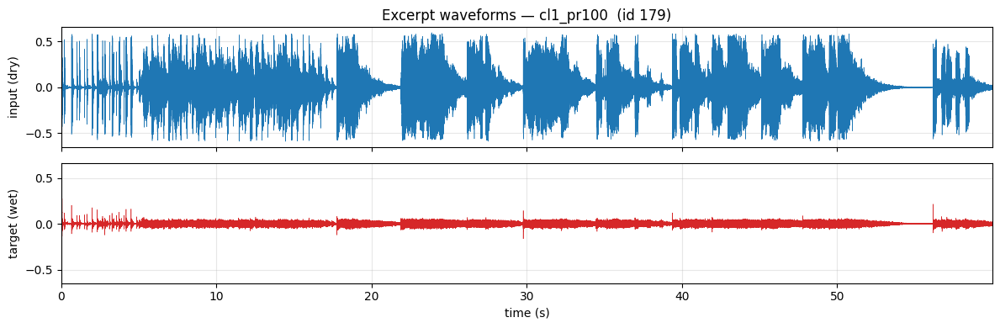

Input (dry):


Target (wet):


In [9]:
# ── Input & target audio for the time-varying excerpt ──────────────────────
# Waveforms (same time axis as the maps above) plus playable audio so the FRF /
# coherence can be heard against the dry input and the compressed target.
from IPython.display import Audio, display

_dry_np = _dry.squeeze(0).numpy()
_wet_np = _wet.squeeze(0).numpy()
_t_axis = np.arange(len(_dry_np)) / SAMPLE_RATE + ANALYSIS_START_SEC

fig, (ax_in, ax_tg) = plt.subplots(2, 1, figsize=(12, 4), sharex=True, sharey=True)
ax_in.plot(_t_axis, _dry_np, lw=0.4, color="#1f77b4")
ax_in.set_ylabel("input (dry)")
ax_in.set_title(f"Excerpt waveforms — {SETTING_3D}  (id {PAIR_3D['id']})")
ax_in.grid(alpha=0.3)
ax_tg.plot(_t_axis, _wet_np, lw=0.4, color="#d62728")
ax_tg.set_ylabel("target (wet)")
ax_tg.set_xlabel("time (s)")
ax_tg.grid(alpha=0.3)
ax_in.set_xlim(_t_axis[0], _t_axis[-1])
plt.tight_layout()
plt.show()

# Scale both by a common peak (normalize=False) so the dry/wet level difference
# — i.e. the gain reduction — stays audible between the two players.
_peak = max(np.abs(_dry_np).max(), np.abs(_wet_np).max(), 1e-9)
print("Input (dry):")
display(Audio(np.clip(_dry_np / _peak, -1, 1), rate=SAMPLE_RATE, normalize=False))
print("Target (wet):")
display(Audio(np.clip(_wet_np / _peak, -1, 1), rate=SAMPLE_RATE, normalize=False))


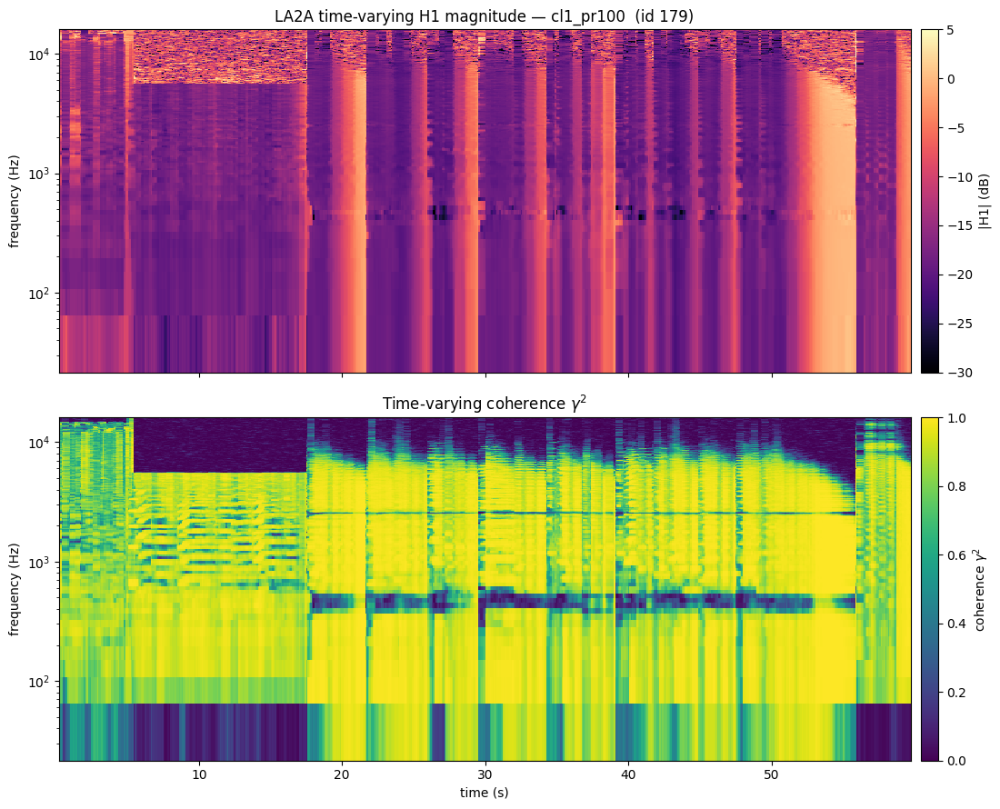

In [10]:
# ── Heatmaps: time x frequency, coloured by |H1| (dB) and by coherence ──────
fmask3d = (TV_FREQS >= 20.0) & (TV_FREQS <= TV_FMAX)
tv_mag_db = 20 * np.log10(np.abs(TV_H1) + EPS)

fig, (ax_h, ax_c) = plt.subplots(2, 1, figsize=(12, 9), sharex=True)
pm_h = ax_h.pcolormesh(TV_TIMES, TV_FREQS[fmask3d], tv_mag_db[fmask3d],
                       shading="auto", cmap="magma", vmin=-30, vmax=5)
ax_h.set_yscale("log")
ax_h.set_ylabel("frequency (Hz)")
ax_h.set_title(f"LA2A time-varying H1 magnitude — {SETTING_3D}  (id {PAIR_3D['id']})")
fig.colorbar(pm_h, ax=ax_h, label="|H1| (dB)", pad=0.01)

pm_c = ax_c.pcolormesh(TV_TIMES, TV_FREQS[fmask3d], TV_COH[fmask3d],
                       shading="auto", cmap="viridis", vmin=0.0, vmax=1.0)
ax_c.set_yscale("log")
ax_c.set_ylabel("frequency (Hz)")
ax_c.set_xlabel("time (s)")
ax_c.set_title("Time-varying coherence $\\gamma^2$")
fig.colorbar(pm_c, ax=ax_c, label="coherence $\\gamma^2$", pad=0.01)
plt.tight_layout()
plt.show()


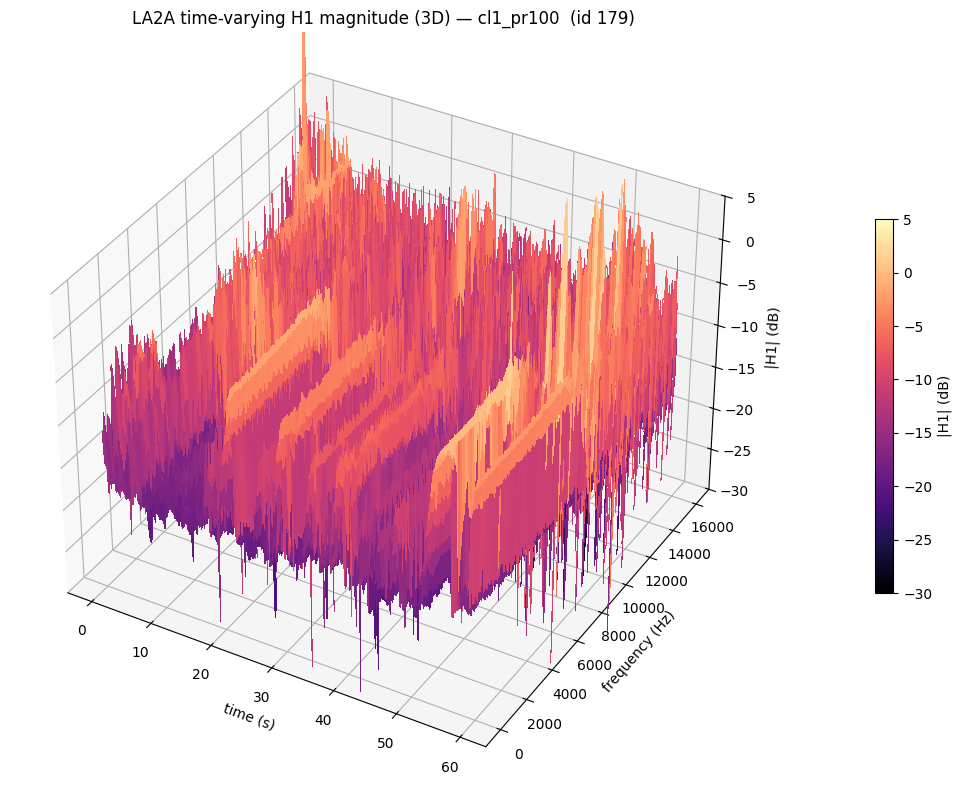

In [11]:
# ── 3D surface of the time-varying H1 magnitude ────────────────────────────
ds = max(1, len(TV_TIMES) // 250)
T_grid, F_grid = np.meshgrid(TV_TIMES[::ds], TV_FREQS[fmask3d])
Z = tv_mag_db[fmask3d][:, ::ds]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection="3d")
surf = ax.plot_surface(T_grid, F_grid, Z, cmap="magma", vmin=-30, vmax=5,
                       linewidth=0, antialiased=False, rcount=120, ccount=160)
ax.set_xlabel("time (s)")
ax.set_ylabel("frequency (Hz)")
ax.set_zlabel("|H1| (dB)")
ax.set_zlim(-30, 5)
ax.view_init(elev=35, azim=-60)
ax.set_title(f"LA2A time-varying H1 magnitude (3D) — {SETTING_3D}  (id {PAIR_3D['id']})")
fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.1, label="|H1| (dB)")
plt.tight_layout()
plt.show()


## Time-varying maps — loud sections only (noise-gated)

The SignalTrain test signal has quiet dips between bursts, where the FRF /
coherence estimate is meaningless (near-zero input power in the denominator).
Here we **gate on the input level**: each time column whose dry-input RMS falls
below `GATE_DB` is masked out, so only the loud parts are plotted. The bottom
panel shows the per-column input level and the gate, with the gated (quiet) spans
shaded grey.

For this excerpt the 0.5 s block-RMS floor is ≈ −63 dBFS, so the suggested
−64 dBFS gate would keep everything; `GATE_DB` is therefore set to **−45 dBFS**,
which trims the genuine near-silent inter-burst dips. Adjust `GATE_DB` to taste.

Input level (0.5 s block RMS): min -63.3 | median -18.0 | max -12.0 dBFS
Gate: keep columns with input level >= -45 dBFS
Loud columns kept : 582/603 (96.5% of the 59s excerpt)


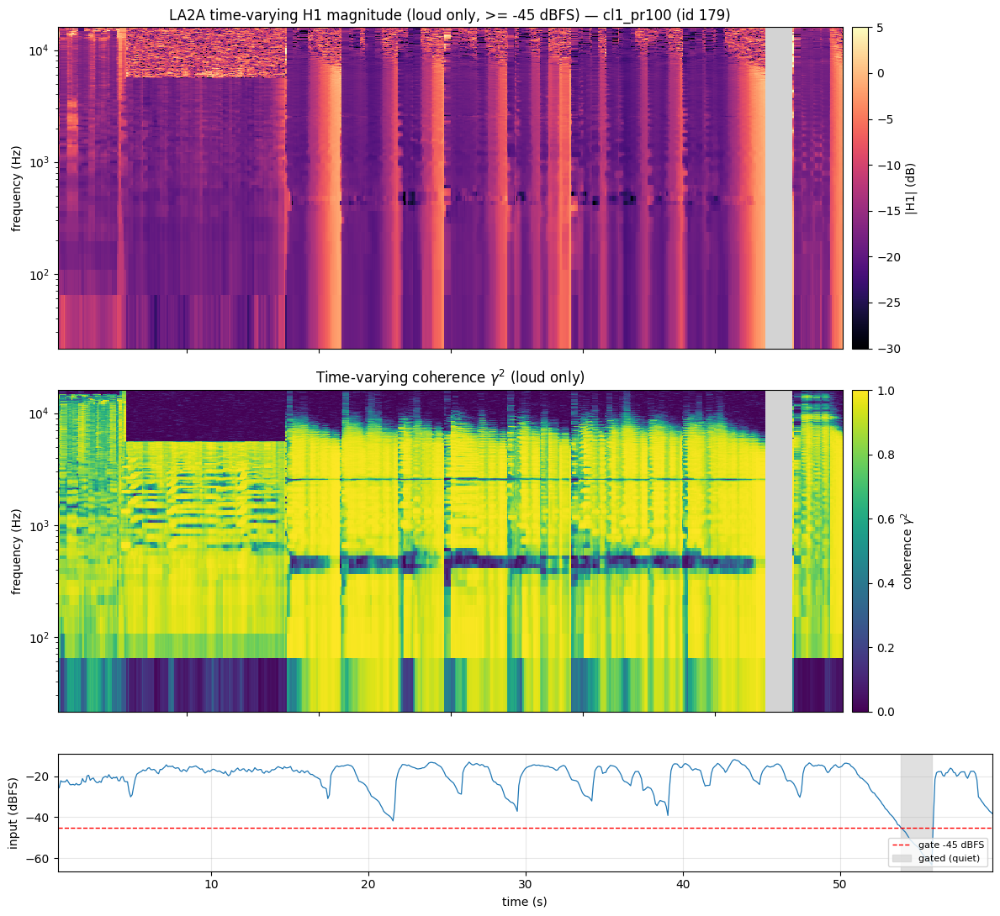

In [12]:
# ── Loudness-gated time-varying maps: keep only the loud sections ───────────
# Quiet passages give an ill-conditioned FRF/coherence (tiny input power in the
# denominator). Gate out every time column whose INPUT level is below GATE_DB so
# only the loud parts remain; quiet columns are blanked (grey).
#
# NB: the 0.5 s block-RMS floor of this excerpt is ~-63 dBFS, so a -64 dBFS gate
# removes nothing — the genuine inter-burst dips sit around -33..-57 dBFS. -45
# dBFS trims those near-silent gaps while keeping all the program material.
GATE_DB = -45.0

# Per-STFT-frame input RMS on the SAME framing as the FRF, then pooled per block
# so the level series lines up column-for-column with TV_TIMES.
_frame_rms = librosa.feature.rms(
    y=np.ascontiguousarray(_dry_np, np.float32),
    frame_length=TV_WIN, hop_length=TV_HOP, center=False,
)[0]
_n_fr = len(_frame_rms)
_bstep = max(1, int(round(TV_BLOCK_HOP_SEC * SAMPLE_RATE / TV_HOP)))
col_rms = np.array([
    np.sqrt(np.mean(_frame_rms[s:s + TV_FPB] ** 2))
    for s in range(0, _n_fr - TV_FPB + 1, _bstep)
])
col_level_db = 20 * np.log10(col_rms + EPS)

m = min(len(col_level_db), len(TV_TIMES))            # defensive length match
col_level_db, t_g = col_level_db[:m], TV_TIMES[:m]
loud = col_level_db >= GATE_DB

print(f"Input level (0.5 s block RMS): min {col_level_db.min():.1f} | "
      f"median {np.median(col_level_db):.1f} | max {col_level_db.max():.1f} dBFS")
print(f"Gate: keep columns with input level >= {GATE_DB:.0f} dBFS")
print(f"Loud columns kept : {loud.sum()}/{len(loud)} "
      f"({100 * loud.mean():.1f}% of the {t_g[-1] - t_g[0]:.0f}s excerpt)")

# Mask quiet columns (NaN -> rendered with the colormap's 'bad' colour).
mag_g = tv_mag_db[:, :m].copy(); mag_g[:, ~loud] = np.nan
coh_g = TV_COH[:, :m].copy();    coh_g[:, ~loud] = np.nan

cmap_mag = plt.get_cmap("magma").copy(); cmap_mag.set_bad("lightgray")
cmap_coh = plt.get_cmap("viridis").copy(); cmap_coh.set_bad("lightgray")

fig, (ax_h, ax_c, ax_l) = plt.subplots(
    3, 1, figsize=(12, 11), sharex=True, gridspec_kw={"height_ratios": [3, 3, 1.1]},
)

pm_h = ax_h.pcolormesh(t_g, TV_FREQS[fmask3d], mag_g[fmask3d],
                       shading="auto", cmap=cmap_mag, vmin=-30, vmax=5)
ax_h.set_yscale("log"); ax_h.set_ylabel("frequency (Hz)")
ax_h.set_title(f"LA2A time-varying H1 magnitude (loud only, >= {GATE_DB:.0f} dBFS) "
               f"— {SETTING_3D} (id {PAIR_3D['id']})")
fig.colorbar(pm_h, ax=ax_h, label="|H1| (dB)", pad=0.01)

pm_c = ax_c.pcolormesh(t_g, TV_FREQS[fmask3d], coh_g[fmask3d],
                       shading="auto", cmap=cmap_coh, vmin=0.0, vmax=1.0)
ax_c.set_yscale("log"); ax_c.set_ylabel("frequency (Hz)")
ax_c.set_title("Time-varying coherence $\\gamma^2$ (loud only)")
fig.colorbar(pm_c, ax=ax_c, label="coherence $\\gamma^2$", pad=0.01)

ax_l.plot(t_g, col_level_db, lw=0.9, color="#1f77b4")
ax_l.axhline(GATE_DB, color="r", ls="--", lw=1.0, label=f"gate {GATE_DB:.0f} dBFS")
_lo, _hi = col_level_db.min() - 3, col_level_db.max() + 3
ax_l.fill_between(t_g, _lo, _hi, where=~loud, color="lightgray", alpha=0.7,
                  step="mid", label="gated (quiet)")
ax_l.set_ylim(_lo, _hi); ax_l.set_ylabel("input (dBFS)"); ax_l.set_xlabel("time (s)")
ax_l.grid(alpha=0.3); ax_l.legend(loc="lower right", fontsize=8)
ax_l.set_xlim(t_g[0], t_g[-1])

plt.tight_layout()
plt.show()
